In [1]:
from astropy.wcs import WCS
from astropy.io import fits 
import matplotlib.pyplot as plt 
import numpy as np
from astropy.visualization import ZScaleInterval
import astropy.units as u 
from astropy.coordinates import SkyCoord
from astroquery.simbad import Simbad
import pandas as pd
import os
from astroquery.vizier import Vizier
from regions import PixCoord, CirclePixelRegion
import scipy
vizier = Vizier()
vizier.ROW_LIMIT = -1
Simbad.add_votable_fields("otype", "dim","nbref")

data_dir = os.getenv("DATADIR")

plt.style.use(data_dir+'bl.mplstyle')

def get_anna_coords(r,d,optical_hdu):
    x,y = WCS(optical_hdu,naxis=2).all_world2pix(r,d,0)
    return y,x

def get_object(name,hdu):
        result_table = Simbad.query_object(name).to_pandas()
        if len(result_table)== 0:
            print(f'Object {name} not found in Simbad')
            return None
        ngc_co = SkyCoord(result_table.ra,result_table.dec,unit='deg')
        ngc_y,ngc_x = get_anna_coords(ngc_co.ra.deg,ngc_co.dec.deg,hdu)
        return ngc_x,ngc_y

# Get Anna O'Grady's Images of the MCs
lmc_hdu = fits.open(data_dir+'4_MagellanicClouds/Photos/anna_lmc.fits')[0]
smc_hdu = fits.open(data_dir+'4_MagellanicClouds/Photos/anna_smc.fits')[0]
lmc_data = np.copy(lmc_hdu.data.T)

# Get Candidates
df = pd.read_csv(data_dir+'0_SUMS_Catalogs/FinalCatalogs/SUMS_UV_Candidate_Catalog.csv')
smc = df[df.RA < 30]
lmc = df[df.RA > 30]
smc_x,smc_y = get_anna_coords(smc.RA,smc.Dec,smc_hdu)
lmc_x,lmc_y = get_anna_coords(lmc.RA,lmc.Dec,lmc_hdu)

# What is the coordinate range of the full SUMS catalog?
df_full = pd.read_csv(data_dir+'0_SUMS_Catalogs/FinalCatalogs/SUMS_UV_Catalog.csv')
pad = 0.5
lmc_ra_min,lmc_ra_max = df_full[df_full.RA > 30].RA.min() - pad,df_full[df_full.RA > 30].RA.max() + pad
smc_ra_min,smc_ra_max = df_full[df_full.RA < 30].RA.min() - pad,df_full[df_full.RA < 30].RA.max() + pad
lmc_dec_min,lmc_dec_max = df_full[df_full.RA > 30].Dec.min() - pad,df_full[df_full.RA > 30].Dec.max() + pad
smc_dec_min,smc_dec_max = df_full[df_full.RA < 30].Dec.min() - pad,df_full[df_full.RA < 30].Dec.max() + pad

# Get list of LMC Clusters that overlap our coverage 
lmc_simbad = Simbad.query_object("lmc").to_pandas()
lmc_co = SkyCoord(lmc_simbad.ra,lmc_simbad.dec,unit='deg')
result = Simbad.query_region(lmc_co, radius="4deg",
                             criteria="otype = 'Cluster*'").to_pandas()
result = result[(result['ra'] > lmc_ra_min) & (result['ra'] < lmc_ra_max) &
       (result['dec'] > lmc_dec_min) & (result['dec'] < lmc_dec_max)]
# Reduce by number of references and size
result = result[result['nbref'] > 20]
result = result[~result.galdim_majaxis.isnull() & (result.galdim_majaxis > 1)]
result = result.sort_values('nbref', ascending=False).reset_index(drop=True) 
lmc_simbad_co = SkyCoord(result.ra,result.dec,unit='deg')
lmc_cluster_x, lmc_cluster_y = get_anna_coords(lmc_simbad_co.ra.deg,lmc_simbad_co.dec.deg,lmc_hdu)
result['x'] = lmc_cluster_x
result['y'] = lmc_cluster_y
ra1,dec1 = WCS(lmc_hdu,naxis=2).all_pix2world(1728,2592,0)
ra2,dec2 = WCS(lmc_hdu,naxis=2).all_pix2world(1728+1,2592,0)
lmc_sep = SkyCoord(ra1,dec1,unit='deg').separation(SkyCoord(ra2,dec2,unit='deg')).degree * u.degree / u.pixel
radii_deg = [((r * u.arcmin).to(u.deg) / lmc_sep).value for r in result.galdim_majaxis]
result['radii'] = radii_deg
result.main_id = result.main_id.str.replace(' ','') 

# Get list of SMC Clusters that overlap our coverage 
smc_simbad = Simbad.query_object("smc").to_pandas()
smc_co = SkyCoord(smc_simbad.ra,smc_simbad.dec,unit='deg')
smc_result = Simbad.query_region(smc_co, radius="4deg",
                             criteria="otype = 'Cluster*'").to_pandas()
smc_result = smc_result[(smc_result['ra'] > smc_ra_min) & (smc_result['ra'] < smc_ra_max) &
       (smc_result['dec'] > smc_dec_min) & (smc_result['dec'] < smc_dec_max)]
# Manually add NGC371 which is missing
cluster2 = Simbad.query_object("NGC371").to_pandas()
smc_result = pd.concat([smc_result,cluster2])
# SORT BY NBREF 
smc_result = smc_result.sort_values('nbref', ascending=False).reset_index(drop=True) 
smc_simbad_co = SkyCoord(smc_result.ra,smc_result.dec,unit='deg')
smc_cluster_x, smc_cluster_y = get_anna_coords(smc_simbad_co.ra.deg,smc_simbad_co.dec.deg,smc_hdu)
smc_result['x'] = smc_cluster_x
smc_result['y'] = smc_cluster_y
smc_result.main_id = smc_result.main_id.str.replace(' ','')
ra1,dec1 = WCS(smc_hdu,naxis=2).all_pix2world(1728, 2592,0)
ra2,dec2 = WCS(smc_hdu,naxis=2).all_pix2world(1728+1,2592,0)
smc_sep = SkyCoord(ra1,dec1,unit='deg').separation(SkyCoord(ra2,dec2,unit='deg')).degree * u.degree / u.pixel
smc_radii_deg = [((r * u.arcmin).to(u.deg) / smc_sep).value for r in smc_result.galdim_majaxis]
smc_result['radii'] = smc_radii_deg

(5184, 3456, 3)


/var/folders/v7/3cz8p5d553b7s1dcymxc7m1hdpkh95/T/ipykernel_12622/791555401.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  smc['rotated_x'] = rotated_x
/var/folders/v7/3cz8p5d553b7s1dcymxc7m1hdpkh95/T/ipykernel_12622/791555401.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  smc['rotated_y'] = rotated_y


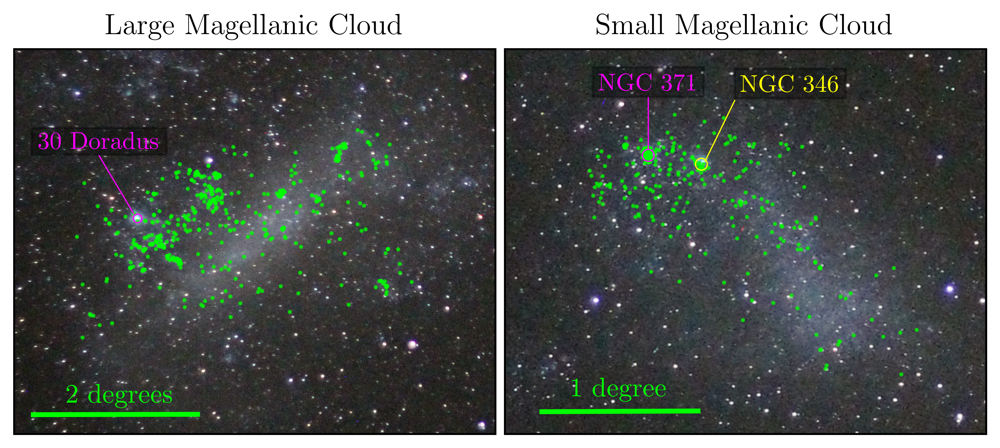

In [5]:
scatter_alpha=0.7

f, (ax,bx) = plt.subplots(1,2,dpi=1000,figsize=(7.13,4))

# Axis limits
lmc_xdim = [200,1450]
lmc_ydim = [1550+150,2800-100]
smc_xdim = [1150,1900-100]
smc_ydim = [2300+50,3000-130]
[ax.set_xticks([]) for ax in [ax,bx]]
[ax.set_yticks([]) for ax in [ax,bx]]
[ax.set_xlim(xdim) for ax,xdim in zip([ax,bx],[lmc_xdim,smc_xdim])]
[ax.set_ylim(ydim) for ax,ydim in zip([ax,bx],[lmc_ydim,smc_ydim])]


# RULER # 
# LMC
x1,y1 = lmc_xdim[0]+50,lmc_ydim[0]+50
x2 = x1 + 426.5
y2 = y1 + 1
lmc_conv = 0.00468938993748 # Deg per pixel 
coord1 = WCS(smc_hdu,naxis=2).all_pix2world(x1,y1,0)
coord2 = WCS(smc_hdu,naxis=2).all_pix2world(x2,y2,0)
dist = SkyCoord(coord1[0],coord1[1],unit='deg').separation(SkyCoord(coord2[0],coord2[1],unit='deg')).degree 
ax.plot([x1,x2],[y1,y2],color='lime',lw=2)
ax.text((x1+x2)/2-127,(y1+y2)/2+30,'2 degrees',color='lime',fontsize=11)
# SMC
x1,y1 = smc_xdim[0]+50,smc_ydim[0]+30
x2 = x1 + (440/2) - 9
y2 = y1 + 1
conv = 0.00270288867837 # Deg per pixel 
coord1 = WCS(smc_hdu,naxis=2).all_pix2world(x1,y1,0)
coord2 = WCS(smc_hdu,naxis=2).all_pix2world(x2,y2,0)
dist = SkyCoord(coord1[0],coord1[1],unit='deg').separation(SkyCoord(coord2[0],coord2[1],unit='deg')).degree 
bx.plot([x1,x2],[y1,y2],color='lime',lw=2)
bx.text((x1+x2)/2-65,(y1+y2)/2+20,'1 degree',color='lime',fontsize=11) 

# Titles
ax.set_title('Large Magellanic Cloud',fontsize=12)
bx.set_title('Small Magellanic Cloud',fontsize=12)
plt.subplots_adjust(wspace=0.02)

#######
# LMC #
#######
vmin, vmax = ZScaleInterval().get_limits(lmc_hdu.data.T)
lmc_hdu = fits.open(data_dir+'4_MagellanicClouds/Photos/anna_lmc.fits')[0]
lmc_image_data = lmc_hdu.data.T

angle = 75
# Rotate the image so N and E are facing correctly
rotated_image = scipy.ndimage.rotate(lmc_image_data, angle, reshape=False)
# Plot the rotated image
ax.imshow(rotated_image,origin='lower',cmap='gray',vmin=vmin,vmax=vmax)
# Image center
center_y, center_x = np.array(lmc_image_data[:,:,0].shape) / 2  # note: shape = (rows, cols)
# Convert angle to radians, and rotate clockwise to match scipy's convention
theta = np.deg2rad(-angle)
# Build rotation matrix
R = np.array([
    [np.cos(theta), -np.sin(theta)],
    [np.sin(theta),  np.cos(theta)]
])
# Translate positions to center, apply rotation, then translate back
def rotate_positions(xy, center, R):
    return (R @ (xy - center).T).T + center

# Rotate sources
sources = np.array(list(zip(lmc_x,lmc_y)))  # shape (N, 2), with columns [x, y]
rotated_sources = rotate_positions(sources, np.array([center_x, center_y]), R)
rotated_x = rotated_sources[:, 0]
rotated_y = rotated_sources[:, 1]
ax.scatter(rotated_x,rotated_y, s=0.5, color='lime', alpha=scatter_alpha)

# Rotate 30 DORADUS
cluster_sources = np.array(list(zip(lmc_cluster_x,lmc_cluster_y)))  # shape (N, 2), with columns [x, y]
rotated_cluster_sources = rotate_positions(cluster_sources, np.array([center_x, center_y]), R)
rotated_cluster_x = rotated_cluster_sources[:, 0]
rotated_cluster_y = rotated_cluster_sources[:, 1]
result['rotated_x'] = rotated_cluster_x
result['rotated_y'] = rotated_cluster_y
color = "magenta"
cluster = result[result.main_id == 'NGC2070']
region = CirclePixelRegion(center=PixCoord(cluster.rotated_x.values[0], cluster.rotated_y.values[0]), radius=11)#cluster.radii.values[0])
region.plot(ax=ax, color=color, lw=0.5, alpha=1)
# Add the cluster name to the plot
x_adjust = -100
y_adjust = 100-5
ax.text(cluster.rotated_x.values[0]+x_adjust, cluster.rotated_y.values[0]+100+y_adjust, '30 Doradus', color=color, fontsize=10, ha='center', va='center')
# Make box with rounded corners
ax.add_patch(plt.Rectangle((cluster.rotated_x.values[0]-175+x_adjust, cluster.rotated_y.values[0]+70+y_adjust), 350, 70, color='k', alpha=0.3, lw=1))    
# Make line connect circle to text
lx1 = cluster.rotated_x.values[0] - 10
ly1 = cluster.rotated_y.values[0] + cluster.radii.values[0]
lx2 = cluster.rotated_x.values[0]-175+x_adjust + (350/2)
ly2 = cluster.rotated_y.values[0]+70+y_adjust-2
ax.plot([lx1, lx2], [ly1, ly2], color=color, lw=0.5)

#######
# SMC #
#######
vmin, vmax = ZScaleInterval().get_limits(smc_hdu.data.T)
smc_hdu = fits.open(data_dir+'4_MagellanicClouds/Photos/anna_smc.fits')[0]
image_data = smc_hdu.data.T

angle = 27
# Rotate the image
rotated_image = scipy.ndimage.rotate(image_data, angle, reshape=False)
print(rotated_image.shape)
# Plot the rotated image
bx.imshow(rotated_image,origin='lower',cmap='gray',vmin=vmin,vmax=vmax)
# Image center
center_y, center_x = np.array(image_data[:,:,0].shape) / 2  # note: shape = (rows, cols)
# Convert angle to radians, and rotate clockwise to match scipy's convention
theta = np.deg2rad(-angle)
# Build rotation matrix
R = np.array([
    [np.cos(theta), -np.sin(theta)],
    [np.sin(theta),  np.cos(theta)]
])
# Translate positions to center, apply rotation, then translate back
def rotate_positions(xy, center, R):
    return (R @ (xy - center).T).T + center
# Rotate sources
sources = np.array(list(zip(smc_x,smc_y)))  # shape (N, 2), with columns [x, y]
rotated_sources = rotate_positions(sources, np.array([center_x, center_y]), R)
rotated_x = rotated_sources[:, 0]
rotated_y = rotated_sources[:, 1]
smc['rotated_x'] = rotated_x
smc['rotated_y'] = rotated_y
bx.scatter(rotated_x,rotated_y, s=0.5, color='lime', alpha=scatter_alpha)

# Rotate NGC 346
cluster_sources = np.array(list(zip(smc_cluster_x,smc_cluster_y))) 
rotated_cluster_sources = rotate_positions(cluster_sources, np.array([center_x, center_y]), R)
rotated_cluster_x = rotated_cluster_sources[:, 0]
rotated_cluster_y = rotated_cluster_sources[:, 1]
smc_result['rotated_x'] = rotated_cluster_x
smc_result['rotated_y'] = rotated_cluster_y
color = "yellow"
cluster = smc_result[smc_result.main_id == 'NGC346']
region = CirclePixelRegion(center=PixCoord(cluster.rotated_x.values[0], cluster.rotated_y.values[0]), radius=8)
region.plot(ax=bx, color=color, lw=0.5, alpha=1)
x_adjust = 120
y_adjust = 105
bx.text(cluster.rotated_x.values[0]+x_adjust, cluster.rotated_y.values[0]+y_adjust, 'NGC 346', color=color, fontsize=10, ha='center', va='center')
bx.add_patch(plt.Rectangle((cluster.rotated_x.values[0]-75+x_adjust, cluster.rotated_y.values[0]+y_adjust-20+4), 150, 40, color='k', alpha=0.3, lw=1))
# Make line connect circle to text
lx1 = cluster.rotated_x.values[0] +5
ly1 = cluster.rotated_y.values[0] + 4
lx2 = cluster.rotated_x.values[0]-150+x_adjust + (150/2)
ly2 = cluster.rotated_y.values[0]+y_adjust-19
bx.plot([lx1, lx2], [ly1, ly2], color=color, lw=0.5)    

# Rotate NGC 371
color = "magenta"
cluster = smc_result[smc_result.main_id == 'NGC371']
region = CirclePixelRegion(center=PixCoord(cluster.rotated_x.values[0], cluster.rotated_y.values[0]), radius=8)
region.plot(ax=bx, color=color, lw=0.5, alpha=1)
x_adjust = 0
y_adjust = -5
bx.text(cluster.rotated_x.values[0]+x_adjust, cluster.rotated_y.values[0]+100+y_adjust, 'NGC 371', color=color, fontsize=10, ha='center', va='center')
bx.add_patch(plt.Rectangle((cluster.rotated_x.values[0]-75+x_adjust, cluster.rotated_y.values[0]+80+y_adjust+4), 150, 40, color='k', alpha=0.3, lw=1))   
# Make line connect circle to text
lx1 = cluster.rotated_x.values[0] 
ly1 = cluster.rotated_y.values[0] + 8
lx2 = cluster.rotated_x.values[0]-75+x_adjust + (150/2)
ly2 = cluster.rotated_y.values[0]+80+y_adjust +3
bx.plot([lx1, lx2], [ly1, ly2], color=color, lw=0.5)    
plt.savefig('candidate_geography.pdf',bbox_inches='tight')